# ___Saudi Arabia Weather  Project___

## Overview

__The dataset was gathered from [Kaggle website](https://www.kaggle.com/esraamadi/saudi-arabia-weather-history). It has over 250K of climate records that was taken from 2017 until 2019(January to April). in this regression project we will use the Temperature as our target to make our predictions.__
__Features included are as follows:__

-  City (It was named region when downloading the dataset and there is a newer version has City as a column).
-  Date.
-  Year.
-  Month.
-  Day.
-  Time.
-  Weather.
-  Temp: Our target in which we'll train our model to predict its values.
-  Wind.
-  Humidity.
-  Barometer.
-  Visibility.
-  Index.

----

## ___Data Exploration & Cleaning___

In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px
import patsy
import warnings
# from datetime import datetime
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default='notebook'
%pylab inline
%config InlineBackend.figure_formats = ['retina']
sns.set_style("darkgrid", {"font.family": ["Times New Roman"]})
sns.set_context("talk") 

Populating the interactive namespace from numpy and matplotlib


__Initially, I will drop date, time, minute, and index columns just for simplicity.__

In [2]:
df = pd.read_csv('weather-sa-2017-2019-clean.csv')
df.drop(['time','minute','weather','date', 'index'], axis='columns', inplace=True)
df.head(5)

,region,year,month,day,hour,temp,wind,humidity,barometer,visibility
0,Qassim,2017,1,1,24,17,11,64%,1018.0,16
1,Qassim,2017,1,1,1,17,6,64%,1018.0,16
2,Qassim,2017,1,1,3,15,11,72%,1019.0,16
3,Qassim,2017,1,1,4,15,11,72%,1019.0,16
4,Qassim,2017,1,1,5,15,9,72%,1019.0,16


In [3]:
print(df.duplicated().sum())

16


In [4]:
df = df.drop_duplicates(subset=None, keep='first', inplace=False)

In [5]:
df.columns

Index(['region', 'year', 'month', 'day', 'hour', 'temp', 'wind', 'humidity',
       'barometer', 'visibility'],
      dtype='object')

_I will reorder the columns name so our target __Temperature__ become the last column._

In [6]:
df = df[['region', 'year', 'month', 'day', 'hour', 'wind','humidity','visibility','barometer', 'temp']]
df.head()

,region,year,month,day,hour,wind,humidity,visibility,barometer,temp
0,Qassim,2017,1,1,24,11,64%,16,1018.0,17
1,Qassim,2017,1,1,1,6,64%,16,1018.0,17
2,Qassim,2017,1,1,3,11,72%,16,1019.0,15
3,Qassim,2017,1,1,4,11,72%,16,1019.0,15
4,Qassim,2017,1,1,5,9,72%,16,1019.0,15


In [7]:
df.shape

(249007, 10)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249007 entries, 0 to 249022
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   region      249007 non-null  object 
 1   year        249007 non-null  int64  
 2   month       249007 non-null  int64  
 3   day         249007 non-null  int64  
 4   hour        249007 non-null  int64  
 5   wind        249007 non-null  int64  
 6   humidity    248990 non-null  object 
 7   visibility  249007 non-null  int64  
 8   barometer   248935 non-null  float64
 9   temp        249007 non-null  int64  
dtypes: float64(1), int64(7), object(2)
memory usage: 20.9+ MB


In [9]:
print ("Unique values are:\n",df.nunique())

Unique values are:
 region        13
year           3
month         12
day           31
hour          24
wind          44
humidity      92
visibility    15
barometer     46
temp          55
dtype: int64


In [10]:
df.describe()

,year,month,day,hour,wind,visibility,barometer,temp
count,249007.000000,249007.000000,249007.000000,249007.000000,249007.000000,249007.000000,248935.000000,249007.000000
mean,2017.710008,6.050669,15.691021,12.536507,12.956881,11.054007,1015.455488,24.722542
std,0.706120,3.521589,8.787940,6.910197,8.711597,7.052838,6.970922,8.881042
min,2017.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,904.000000,-4.000000
25%,2017.000000,3.000000,8.000000,7.000000,7.000000,5.000000,1011.000000,18.000000
50%,2018.000000,6.000000,16.000000,13.000000,11.000000,16.000000,1016.000000,24.000000
75%,2018.000000,9.000000,23.000000,19.000000,19.000000,16.000000,1021.000000,31.000000
max,2019.000000,12.000000,31.000000,24.000000,163.000000,161.000000,1101.000000,50.000000


- There are some strange values we gathered from the description of the data, -1 in wind, visibility and outliers. 

In [11]:
df.isnull().sum()

region         0
year           0
month          0
day            0
hour           0
wind           0
humidity      17
visibility     0
barometer     72
temp           0
dtype: int64

<AxesSubplot:xlabel='temp', ylabel='Count'>

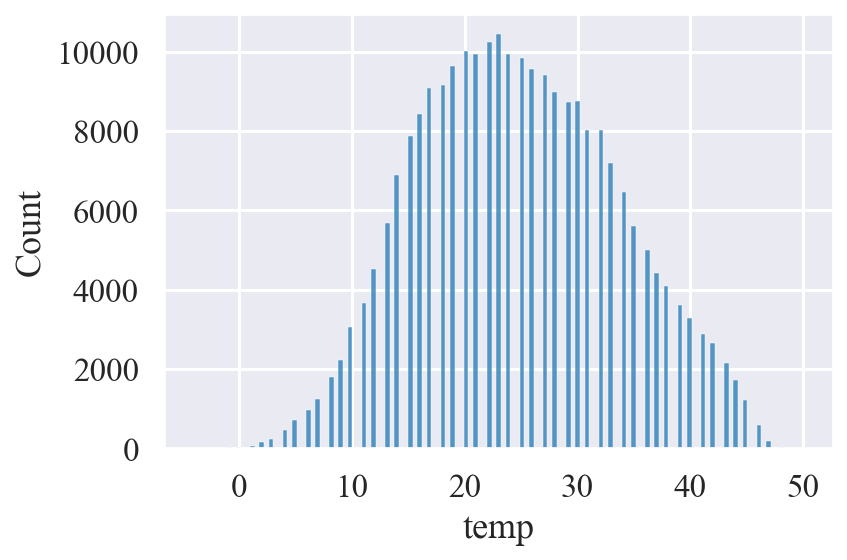

In [12]:
sns.histplot(df.temp)

---

### ___Nans and outliers :<br>___
___I will use mean value to fill in nan values in columns humidity and barometer, outliers on the other hand is gonna be dropped.___

In [13]:
df.barometer = df.barometer.astype(float32)
barometermean = df.barometer.mean()
barometermean

1015.8899536132812

In [14]:
df.barometer = df.barometer.fillna(barometermean).astype(int)

In [15]:
df.humidity = df.humidity.str.replace('%', '')
df.humidity = df.humidity.astype(float32)
humiditymean = df.humidity.mean()
humiditymean

37.55234909057617

In [16]:
df.humidity = df.humidity.fillna(humiditymean).astype(int)
df.isnull().sum()

region        0
year          0
month         0
day           0
hour          0
wind          0
humidity      0
visibility    0
barometer     0
temp          0
dtype: int64

- *___best way to find the exact outlier numbers is throughout this interactive boxplot, let's tackle them in both wind and barometer columns.___*

In [41]:
df.wind[df.wind<0].count()

109

In [18]:
df = df[df.barometer < 1053]
df = df[df.barometer >= 996]
df = df[df.wind <= 37]
df = df[df.wind >= 0] 

In [19]:
Barometer = df.barometer
Wind = df.wind
Visibility = df.visibility
Humidity = df.humidity
data = [
    go.Box(y=df.barometer, name='Barometer'),
    go.Box(y=df.wind, name='Wind'),
    go.Box(y=df.humidity, name='Humidity'),
    go.Box(y=df.humidity, name='Visibility')
]
fig = go.Figure(data=data)
fig.show()

---

 ###  _Some group_by and graphs on the entire dataset_

-  Maximum, Average and Minimum   Temperature 

In [21]:
max_temp = df[['region','temp']].groupby(['region'], as_index=True).max().sort_values(by='temp', ascending=False)
max_temp

,temp
region,
EP,50
Mecca,49
Hail,48
Qassim,48
Madina,47
Northern boarder,47
Riyadh,47
Jawf,46
Tabuk,45


In [22]:
fig = px.bar(max_temp, x = max_temp.index, y = max_temp.temp, orientation ='v',color=max_temp.temp , height=550,width= 1000, title='Maximum Temperature by Region')
fig.update_traces(width=0.6)
fig.show()

In [23]:
avg_temp = df[['region', 'temp']].groupby(['region'], as_index=True).mean().sort_values(by='temp', ascending=False).round(1)
avg_temp

,temp
region,
Mecca,29.0
Madina,28.7
Riyadh,27.9
EP,26.3
Qassim,25.9
Hail,25.9
Northern boarder,25.0
Baha,23.4
Jawf,23.1


In [24]:
fig = px.bar(avg_temp, y = avg_temp.temp, x = avg_temp.index, orientation ='v', color = avg_temp.temp  , height=600,width= 1000, title='Average Temperature by Region')
fig.update_traces(width=0.6)
fig.show()

In [25]:
min_temp = df[['region', 'temp']].groupby(['region'],
as_index=True).min().sort_values(by='temp', ascending=False)
min_temp

,temp
region,
Mecca,16
Madina,6
Baha,4
Assir,3
EP,3
Jazan,3
Najran,2
Riyadh,2
Tabuk,-1


In [26]:
import plotly.express as px
fig = px.bar(min_temp, y = min_temp.temp, x = min_temp.index,color=min_temp.temp,
orientation ='v',height=600,width= 1000, title='Minimum Temperature by Region')
fig.show()

In [27]:
Max_temp = go.Bar(x=max_temp.index,y=max_temp.temp,orientation= 'v',
               name='Maximum Temperature',marker={'color':'red'}, width= 0.3)

Avg_temp = go.Bar(x=avg_temp.index,y=avg_temp.temp,orientation= 'v',
               name='Average Temperature',marker={'color':'gray'}, width= 0.3)

Min_temp = go.Bar(x=min_temp.index,y=min_temp.temp,orientation= 'v',
               name='Minimum Temperature',marker={'color':'blue'}, width= 0.3)

data = [Max_temp,Avg_temp,Min_temp]
layout = go.Layout(title='Temperature by Region')
fig = go.Figure(data=data,layout=layout)
fig.show()

When 

---

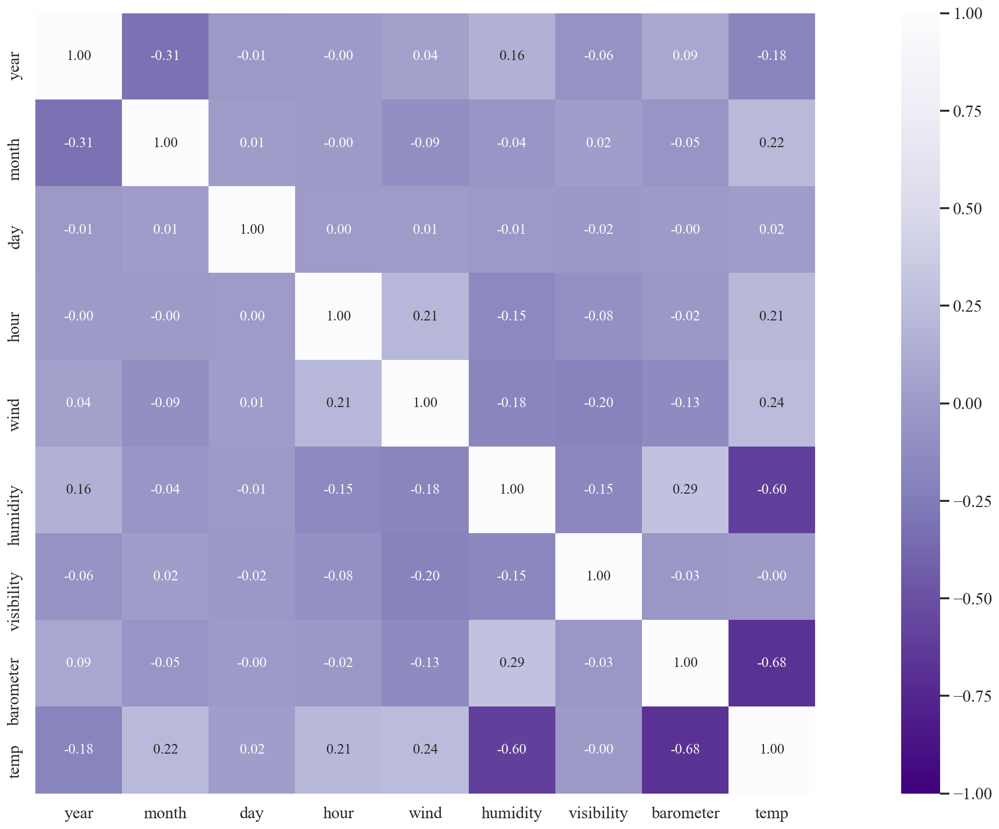

In [219]:
plt.figure(figsize=(30,14))
correlation = df.corr()
sns.heatmap(correlation, vmax=1,vmin=-1, cmap= 'Purples_r', cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 14});

In [28]:
fig = px.scatter(df, y="temp", x= df.barometer, color="month",
                  hover_data=['year'])
fig.show()

- #### ___Only barometer & humidity shows a fairly strong negative correlation with the target value Temp. That is an answer to our question as to what are the features has a strong correlation to our target Temperature___  

In [29]:
fig = px.scatter(df, x="humidity", y="temp", color= 'month')
fig.show()

---

- ___converting column region to dummy variable and move temp to the last column as target
for both datasets as a preparation for the the ols model.___ 

In [30]:
df1 = pd.get_dummies(df, columns=['region'])
df1.head()

,year,month,day,hour,wind,humidity,visibility,barometer,temp,region_Assir,...,region_Hail,region_Jawf,region_Jazan,region_Madina,region_Mecca,region_Najran,region_Northern boarder,region_Qassim,region_Riyadh,region_Tabuk
0,2017,1,1,24,11,64,16,1018,17,0,...,0,0,0,0,0,0,0,1,0,0
1,2017,1,1,1,6,64,16,1018,17,0,...,0,0,0,0,0,0,0,1,0,0
2,2017,1,1,3,11,72,16,1019,15,0,...,0,0,0,0,0,0,0,1,0,0
3,2017,1,1,4,11,72,16,1019,15,0,...,0,0,0,0,0,0,0,1,0,0
4,2017,1,1,5,9,72,16,1019,15,0,...,0,0,0,0,0,0,0,1,0,0


In [31]:
df1 = df1[['year', 'month', 'day', 'hour', 'wind', 'humidity', 'visibility',
       'barometer', 'region_Assir', 'region_Baha', 'region_EP',
       'region_Hail', 'region_Jawf', 'region_Jazan', 'region_Madina',
       'region_Mecca', 'region_Najran', 'region_Northern boarder',
       'region_Qassim', 'region_Riyadh', 'region_Tabuk','temp']]
df1.head()

,year,month,day,hour,wind,humidity,visibility,barometer,region_Assir,region_Baha,...,region_Jawf,region_Jazan,region_Madina,region_Mecca,region_Najran,region_Northern boarder,region_Qassim,region_Riyadh,region_Tabuk,temp
0,2017,1,1,24,11,64,16,1018,0,0,...,0,0,0,0,0,0,1,0,0,17
1,2017,1,1,1,6,64,16,1018,0,0,...,0,0,0,0,0,0,1,0,0,17
2,2017,1,1,3,11,72,16,1019,0,0,...,0,0,0,0,0,0,1,0,0,15
3,2017,1,1,4,11,72,16,1019,0,0,...,0,0,0,0,0,0,1,0,0,15
4,2017,1,1,5,9,72,16,1019,0,0,...,0,0,0,0,0,0,1,0,0,15


---

# ___Fitting the linear & OLS model and some other models.___

- ##  ___Linear Regression___ 

In [32]:
X, y = df1.drop(['temp','year'],axis=1), df1['temp']

lm = LinearRegression() 
lm.fit(X, y)

LinearRegression()

In [33]:
print(lm.intercept_)
print(lm.coef_)

925.8585311158414
[ 0.44196367  0.01052671  0.14442475  0.06139894 -0.1711004  -0.05857025
 -0.88567949  4.08294512  1.86615055 -2.05304436  0.06486631 -2.79923697
  4.03481502 -0.12006795  1.00803435  4.04888027 -4.16595081  0.04103258
 -1.32918784 -4.67923628]


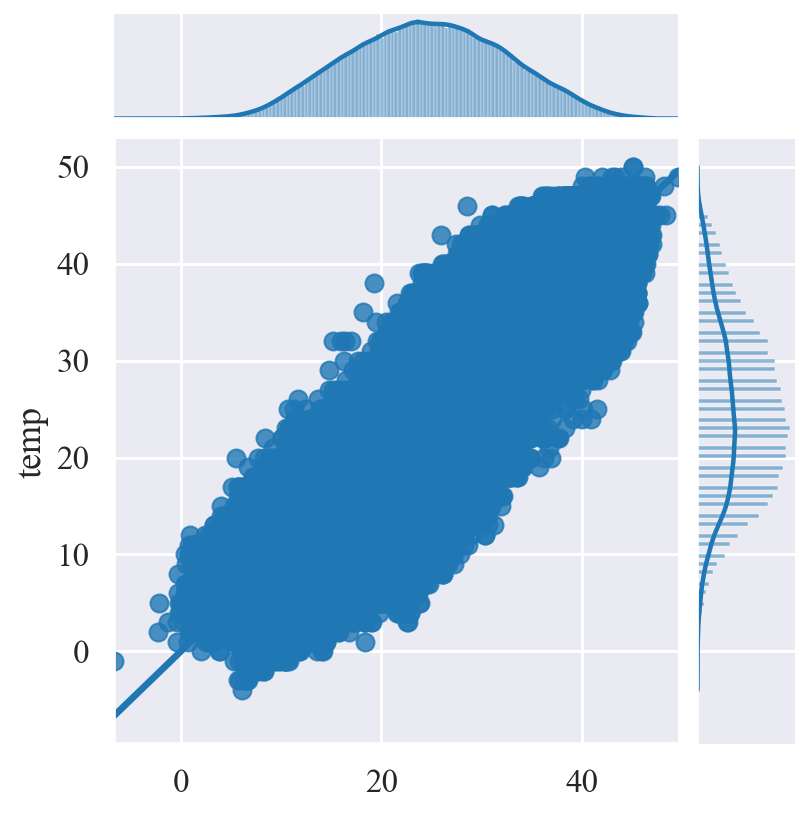

In [34]:
preds = lm.predict(X) 

sns.jointplot(x=preds,y=y, kind='reg')

In [35]:
lm.score(X,y)

0.7769276100514725

###  Model Evaluation SSE, RMSE, and MAE

In [37]:
def SSE(actuals, preds):
    return np.sum((actuals - preds)**2)

SSE(y,preds)

4285943.682153384

In [38]:
def RMSE(actuals, preds): #root mean squared error
    return np.sqrt(np.mean((actuals - preds)**2))

RMSE(y,preds)

4.176425551727014

In [39]:
def MAE(actuals, preds): #mean absolute error
    return np.mean(np.abs(actuals-preds))

MAE(y,preds)

3.302465301556996

In [40]:
def SST(y):
    return np.sum((y - np.mean(y))**2)

def R2(actuals, preds):
    return 1 - SSE(actuals, preds) / SST(actuals)

R2(y,preds)

0.7769276100514725

In [41]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

rmse = mean_squared_error(y, preds, squared=False)
mae = mean_absolute_error(y, preds)

In [42]:
print(rmse)
print(mae)

4.1764255517270215
3.3024653015570244


---

- ## ___OLS model___

In [43]:
# X  = df.iloc[:, : -1].values
# y = df.iloc[:, -1].values

model = sm.OLS(y, X)

# Fit your model to your training set
fit = model.fit()

# Print summary statistics of the model's performance
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   temp   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                 4.504e+04
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        21:21:51   Log-Likelihood:            -6.9990e+05
No. Observations:              245718   AIC:                         1.400e+06
Df Residuals:                  245698   BIC:                         1.400e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
month                       0.4420      0.002    183.307      0.000       0.437       0.447
day                         0.0105      0.001     10.975      0.000       0.009       0.012
hour                        0.1444      0.001    114.700      0.000       0.142       0.147
wind                        0.0614      0.001     55.422      0.000       0.059       0.064
humidity                   -0.1711      0.000   -382.738      0.000      -0.172      -0.170
visibility                 -0.0586      0.001    -46.552      0.000      -0.061      -0.056
barometer                  -0.8857      0.002   -480.904      0.000      -0.889      -0.882
region_Assir              929.9415      1.879    495.034      0.000     926.260     933.623
region_Baha               927.7247      1.872    495.674      0.000     924.056     931.393
region_EP                 923.8055      1.853    498.461      0.000     920.173     927.438
region_Hail               925.9234      1.861    497.561      0.000     922.276     929.571
region_Jawf               923.0593      1.866    494.610      0.000     919.402     926.717
region_Jazan              929.8933      1.878    495.183      0.000     926.213     933.574
region_Madina             925.7385      1.865    496.337      0.000     922.083     929.394
region_Mecca              926.8666      1.850    500.952      0.000     923.240     930.493
region_Najran             929.9074      1.878    495.194      0.000     926.227     933.588
region_Northern boarder   921.6926      1.862    495.121      0.000     918.044     925.341
region_Qassim             925.8996      1.861    497.563      0.000     922.252     929.547
region_Riyadh             924.5293      1.863    496.225      0.000     920.878     928.181
region_Tabuk              921.1793      1.864    494.149      0.000     917.526     924.833
==============================================================================
Omnibus:                     3509.043   Durbin-Watson:                   0.124
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3764.257
Skew:                          -0.274   Prob(JB):                         0.00
Kurtosis:                       3.260   Cond. No.                     8.12e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.12e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## ___Rigorous Validation Method: Cross-Validation / Test___<br>
### ___Linear, Ridge, Poly and Random Forest___

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor


X, y = df1.drop('temp',axis=1), df1['temp']

# hold out 20% of the data for final testing
X, X_test, y, y_test = train_test_split(X, y, test_size=.15, random_state=10)

In [45]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.15, random_state=3)

In [46]:
#set up the 3 models we're choosing from:

lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_test.values)

lm_reg = Ridge(alpha=1)

#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) 

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()

rf = RandomForestRegressor()
dt = DecisionTreeRegressor()

In [47]:
lm.fit(X_train, y_train)
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.3f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.3f}')

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

rf.fit(X_train_scaled, y_train)
print(f'Random Forest val R^2: {rf.score(X_val_scaled, y_val):.3f}')

dt.fit(X_train_scaled, y_train)
print(f'DecisionTree val R^2: {dt.score(X_val_scaled, y_val):.3f}')

Linear Regression val R^2: 0.779
Ridge Regression val R^2: 0.779
Degree 2 polynomial regression val R^2: 0.894
Random Forest val R^2: 0.981
DecisionTree val R^2: 0.961
